# Descriptor function

In [2]:
# descriptor
def dcp(img1, img2) :
    orb = cv2.ORB_create(nfeatures=50)
    brisk = cv2.BRISK_create()
    detector = [orb, brisk]
    for i in [0, 1]:
        didx = i
        print('orb') if didx == 0 else print('brisk')
        kp1, des1 = detector[didx].detectAndCompute(img1, None)
        kp2, des2 = detector[didx].detectAndCompute(img2, None)
        # 2. matcher
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        flann = cv2.FlannBasedMatcher_create()
        matcher = [bf, flann]
        for j in [0, 1]:
            midx = j
            print('BruteForce') if midx == 0 else print('Flann')
            try:
                matches = matcher[midx].match(des1, des2)
            except:
                matches = matcher[midx].match(np.float32(des1), np.float32(des2))
            # result display
            matches = sorted(matches, key = lambda x:x.distance)
            print('len(matches)=', len(matches))
            for k, l in enumerate(matches[:10]):
                print('matches[{}]=(m:{}, queryIdx:{}, trainIdx:{}, distance:{})'.format(k, l,
                                                                                   matches[k].queryIdx,
                                                                                   matches[k].trainIdx,
                                                                                   matches[k].distance))
            img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, flags=2)
#             plt.figure(figsize=(30, 60))
#             plt.imshow(img3)
#             plt.show()
            minDist = matches[0].distance
            good_matches = list(filter(lambda m:m.distance <= 2 * minDist, matches))
            print('len(good_matches)=', len(good_matches))
            if len(good_matches) < 5:
                print('sorry, too small good matches')
                exit()
            img4 = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=2)
#             plt.figure(figsize=(30, 60))
#             plt.imshow(img4)
#             plt.show()
    return good_matches, kp1, kp2

# homography

orb
BruteForce
len(matches)= 20
matches[0]=(m:< cv2.DMatch 0x7ff0b97a9d10>, queryIdx:44, trainIdx:42, distance:29.0)
matches[1]=(m:< cv2.DMatch 0x7ff0b97a9d90>, queryIdx:39, trainIdx:36, distance:64.0)
matches[2]=(m:< cv2.DMatch 0x7ff0b97a9db0>, queryIdx:38, trainIdx:35, distance:66.0)
matches[3]=(m:< cv2.DMatch 0x7ff0b97a9bf0>, queryIdx:0, trainIdx:39, distance:68.0)
matches[4]=(m:< cv2.DMatch 0x7ff0b97a9f50>, queryIdx:12, trainIdx:15, distance:68.0)
matches[5]=(m:< cv2.DMatch 0x7ff0b97a9ad0>, queryIdx:8, trainIdx:1, distance:69.0)
matches[6]=(m:< cv2.DMatch 0x7ff0b97a95d0>, queryIdx:16, trainIdx:6, distance:70.0)
matches[7]=(m:< cv2.DMatch 0x7ff0b97a9d30>, queryIdx:42, trainIdx:40, distance:70.0)
matches[8]=(m:< cv2.DMatch 0x7ff0b97a96f0>, queryIdx:20, trainIdx:30, distance:71.0)
matches[9]=(m:< cv2.DMatch 0x7ff0b97a9ed0>, queryIdx:7, trainIdx:5, distance:72.0)
len(good_matches)= 1
sorry, too small good matches
Flann
len(matches)= 50
matches[0]=(m:< cv2.DMatch 0x7ff09897d570>, queryI

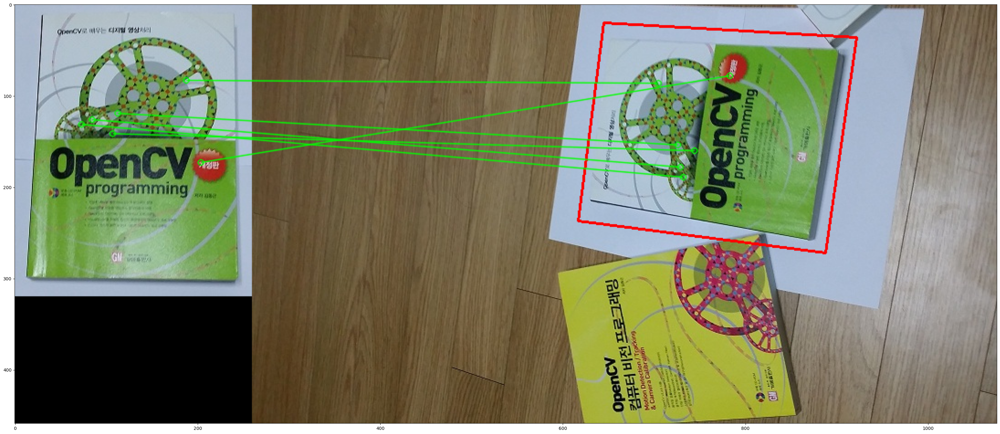

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. 템플릿 이미지, 매칭 이미지 불러오기
src1_bgr = cv2.imread('./image/book1.jpg')
src2_bgr = cv2.imread('./image/book2.jpg')
img1 = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2GRAY) # template image
img2 = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2GRAY) # input image
src1_rgb = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2RGB)
src2_rgb = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2RGB)

# 2. good_matches function
good_matches, kp1, kp2 = dcp(img1, img2)

src1_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches])
src2_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches])

H, mask = cv2.findHomography(src1_pts, src2_pts, cv2.RANSAC, 3.0)
mask_matches = mask.flatten().tolist()

h,w = img1.shape
pts1 = np.float32([[0,0], [0,h-1], [w-1, h-1], [w-1, 0]]).reshape(-1,1,2)
pts2 = cv2.perspectiveTransform(pts1, H)
src2_rgb = cv2.polylines(src2_rgb, [np.int32(pts2)], True, (255,0,0), 2)

draw_params = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask = mask_matches, flags=2)
img5 = cv2.drawMatches(src1_rgb, kp1, src2_rgb, kp2, good_matches, None, **draw_params)

plt.figure(figsize=(40,90))
plt.imshow(img5)
plt.show()

# Homography
### function

In [3]:
def homoGP(good_matches, src1_rgb, kp1, src2_rgb, kp2) :
    # 이제부터 object를 찾는다. 즉 매칭된 결과를 가지고, 처음 가장 잘 된 네 포인트를 비교하여 3x3 행렬을 찾는다.
    # 그리고 영상마다 매칭 포인트의 범위를 찾는다.
    # 예를 들어 템플릿 영상의 네 모서리를 찾고 그 모서리 점에 위의 호포그래피 행렬을 곱해서
    # 나온 결과를 입력영상에 대입한다.

    src1_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]) # 키포인트에 정보를 넣어주면 좌표를 받을 수 있다
    src2_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches])
    H1, mask1 = cv2.findHomography(src1_pts, src2_pts, cv2.RANSAC, 3.0) # H: 호모그래피 행렬, 임계치 3
    H2, mask2 = cv2.findHomography(src1_pts, src2_pts, cv2.LMEDS, 3.0) # H: 호모그래피 행렬, 임계치 3
    H3, mask3 = cv2.findHomography(src1_pts, src2_pts, cv2.RHO, 3.0) # H: 호모그래피 행렬, 임계치 3
    mask_matches1 = mask1.flatten().tolist()
    mask_matches2 = mask2.flatten().tolist()
    mask_matches3 = mask3.flatten().tolist()

    # 마스크는 이미지 형태이므로 2차원을 1차원 변경. 리스트 형태, 밑에 draw_match 파라미터로 들어간다.
    h, w = img1.shape # 이미지 1의 높이, 너비
    pts1 = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

    # 템플릿의 네개의 모서리. (4,1,2) 행렬곱을 위한 자리맞춤
    pts21 = cv2.perspectiveTransform(pts1, H1)
    pts22 = cv2.perspectiveTransform(pts1, H2)
    pts23 = cv2.perspectiveTransform(pts1, H3)

    # 입력영상에 대응되는 네 점
    src2_rgb1 = cv2.polylines(src2_rgb, [np.int32(pts21)], True, (255,0,0), 2)
    src2_rgb2 = cv2.polylines(src2_rgb, [np.int32(pts22)], True, (255,0,0), 2)
    src2_rgb3 = cv2.polylines(src2_rgb, [np.int32(pts23)], True, (255,0,0), 2)
    draw_params1 = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask = mask_matches1, flags = 2)
    draw_params2 = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask = mask_matches2, flags = 2)
    draw_params3 = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask = mask_matches3, flags = 2)

    # 매칭 안되었으면 그리지 말라.
    img5 = cv2.drawMatches(src1_rgb, kp1, src2_rgb1, kp2, good_matches, None, **draw_params1)
    img6 = cv2.drawMatches(src1_rgb, kp1, src2_rgb2, kp2, good_matches, None, **draw_params2)
    img7 = cv2.drawMatches(src1_rgb, kp1, src2_rgb3, kp2, good_matches, None, **draw_params3)

    plt.figure(figsize=(120,120))
    # ax1 = plt.subplot(311)
    # ax2 = plt.subplot(312)
    # ax3 = plt.subplot(313)

    plt.imshow(img5)
    plt.imshow(img6)
    plt.imshow(img7)
    plt.show()
    # 참고로 이 코드는 거의 그대로 쓰이므로 앞으로 그냥 복사만 하면 된다.

## 실습

orb
BruteForce
len(matches)= 20
matches[0]=(m:< cv2.DMatch 0x7fbbb936fc90>, queryIdx:44, trainIdx:42, distance:29.0)
matches[1]=(m:< cv2.DMatch 0x7fbbb936fc30>, queryIdx:39, trainIdx:36, distance:64.0)
matches[2]=(m:< cv2.DMatch 0x7fbbb936fa50>, queryIdx:38, trainIdx:35, distance:66.0)
matches[3]=(m:< cv2.DMatch 0x7fbbb936fd50>, queryIdx:0, trainIdx:39, distance:68.0)
matches[4]=(m:< cv2.DMatch 0x7fbbb936fdd0>, queryIdx:12, trainIdx:15, distance:68.0)
matches[5]=(m:< cv2.DMatch 0x7fbbb936f990>, queryIdx:8, trainIdx:1, distance:69.0)
matches[6]=(m:< cv2.DMatch 0x7fbbb936ff70>, queryIdx:16, trainIdx:6, distance:70.0)
matches[7]=(m:< cv2.DMatch 0x7fbbb936fc70>, queryIdx:42, trainIdx:40, distance:70.0)
matches[8]=(m:< cv2.DMatch 0x7fbbb936f9b0>, queryIdx:20, trainIdx:30, distance:71.0)
matches[9]=(m:< cv2.DMatch 0x7fbbb936feb0>, queryIdx:7, trainIdx:5, distance:72.0)
len(good_matches)= 1
sorry, too small good matches
Flann
len(matches)= 50
matches[0]=(m:< cv2.DMatch 0x7fbbb95724b0>, queryI

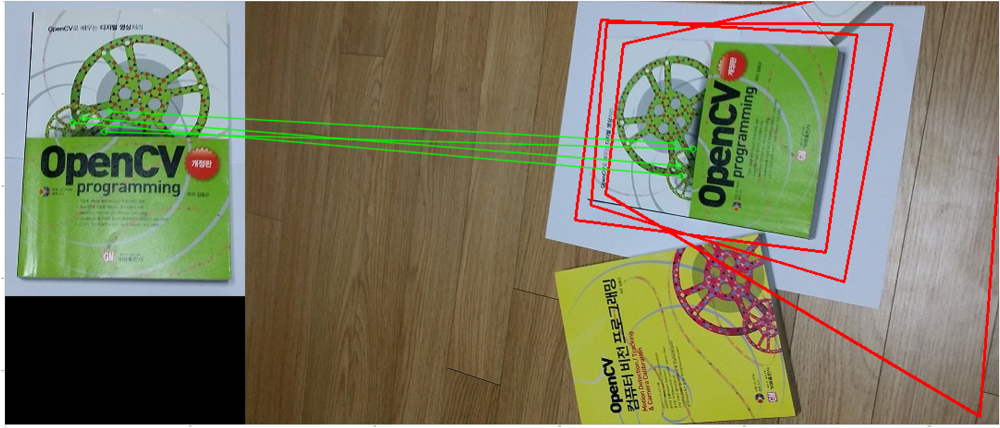

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. 템플릿 이미지, 매칭 이미지 불러오기
src1_bgr = cv2.imread('./image/book1.jpg')
src2_bgr = cv2.imread('./image/book2.jpg')
img1 = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2GRAY) # template image
img2 = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2GRAY) # input image
src1_rgb = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2RGB)
src2_rgb = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2RGB)

# 2. Descriptor Funcion
good_matches, kp1, kp2 = dcp(img1, img2)

# 3. Homography
homoGP(good_matches, src1_rgb, kp1, src2_rgb, kp2)


orb
BruteForce
len(matches)= 20
matches[0]=(m:< cv2.DMatch 0x7f7f09e8d6f0>, queryIdx:5, trainIdx:18, distance:22.0)
matches[1]=(m:< cv2.DMatch 0x7f7f09e8d690>, queryIdx:6, trainIdx:1, distance:38.0)
matches[2]=(m:< cv2.DMatch 0x7f7f09e8d870>, queryIdx:21, trainIdx:26, distance:47.0)
matches[3]=(m:< cv2.DMatch 0x7f7f09e8db50>, queryIdx:31, trainIdx:30, distance:49.0)
matches[4]=(m:< cv2.DMatch 0x7f7f09e8daf0>, queryIdx:26, trainIdx:21, distance:50.0)
matches[5]=(m:< cv2.DMatch 0x7f7f09e8d730>, queryIdx:1, trainIdx:6, distance:52.0)
matches[6]=(m:< cv2.DMatch 0x7f7f09e8d630>, queryIdx:15, trainIdx:23, distance:54.0)
matches[7]=(m:< cv2.DMatch 0x7f7f09e8d670>, queryIdx:9, trainIdx:4, distance:55.0)
matches[8]=(m:< cv2.DMatch 0x7f7f09e8db10>, queryIdx:27, trainIdx:22, distance:58.0)
matches[9]=(m:< cv2.DMatch 0x7f7f09e8db30>, queryIdx:29, trainIdx:46, distance:58.0)
len(good_matches)= 2
sorry, too small good matches
Flann
len(matches)= 50
matches[0]=(m:< cv2.DMatch 0x7f7f09ea52b0>, queryId

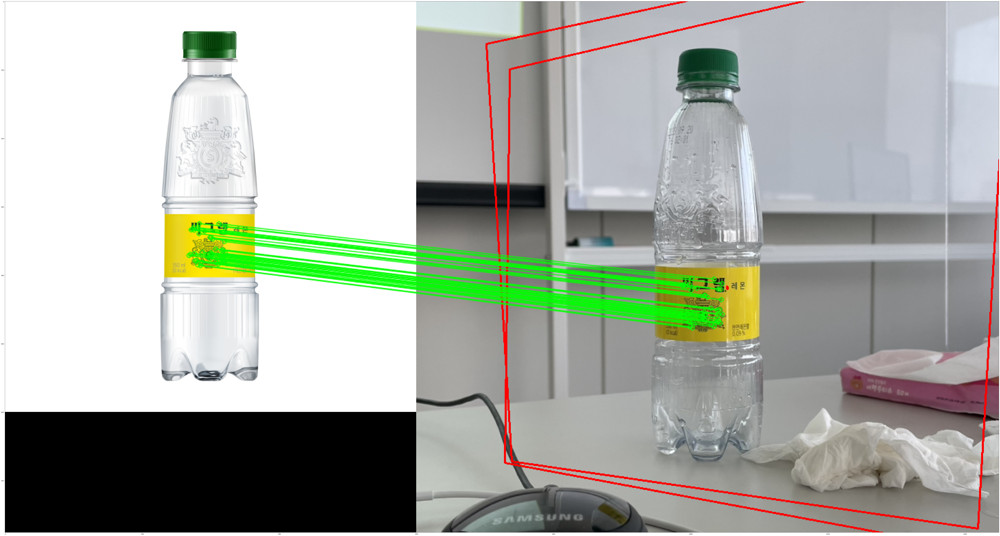

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. 템플릿 이미지, 매칭 이미지 불러오기
src1_bgr = cv2.imread('./image/seagramOG.png')
src2_bgr = cv2.imread('./image/seagramTEST3.png')
src1_bgr = cv2.resize(src1_bgr, dsize=(0,0), fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
src2_bgr = cv2.resize(src2_bgr, dsize=(0,0), fx=0.9, fy=0.9, interpolation=cv2.INTER_AREA)

img1 = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2GRAY) # template image
img2 = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2GRAY) # input image
src1_rgb = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2RGB)
src2_rgb = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2RGB)

# 2. Descriptor Funcion
good_matches, kp1, kp2 = dcp(img1, img2)

# 3. Homography
homoGP(good_matches, src1_rgb, kp1, src2_rgb, kp2)

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. 템플릿 이미지, 매칭 이미지 불러오기
src1_bgr = cv2.imread('./image/openCVbook.jpeg')
src2_bgr = cv2.imread('./image/opencvbookTEST.png')
# src1_bgr = cv2.resize(src1_bgr, dsize=(0,0), fx=0.4, fy=0.4, interpolation=cv2.INTER_LINEAR)
src2_bgr = cv2.resize(src2_bgr, dsize=(0,0), fx=0.6, fy=0.6, interpolation=cv2.INTER_AREA)

img1 = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2GRAY) # template image
img2 = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2GRAY) # input image
src1_rgb = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2RGB)
src2_rgb = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2RGB)

# 2. Descriptor Funcion
good_matches, kp1, kp2 = dcp(img1, img2)

# 3. Homography
homoGP(good_matches, src1_rgb, kp1, src2_rgb, kp2)

orb
BruteForce
len(matches)= 21
matches[0]=(m:< cv2.DMatch 0x7fa173c244d0>, queryIdx:35, trainIdx:36, distance:38.0)
matches[1]=(m:< cv2.DMatch 0x7fa173c24270>, queryIdx:47, trainIdx:47, distance:40.0)
matches[2]=(m:< cv2.DMatch 0x7fa173c24cf0>, queryIdx:26, trainIdx:21, distance:41.0)
matches[3]=(m:< cv2.DMatch 0x7fa173c24690>, queryIdx:28, trainIdx:30, distance:43.0)
matches[4]=(m:< cv2.DMatch 0x7fa173c24a30>, queryIdx:16, trainIdx:16, distance:46.0)
matches[5]=(m:< cv2.DMatch 0x7fa173c24250>, queryIdx:30, trainIdx:32, distance:46.0)
matches[6]=(m:< cv2.DMatch 0x7fa173c240b0>, queryIdx:34, trainIdx:29, distance:48.0)
matches[7]=(m:< cv2.DMatch 0x7fa173c245b0>, queryIdx:10, trainIdx:0, distance:52.0)
matches[8]=(m:< cv2.DMatch 0x7fa173c24b50>, queryIdx:48, trainIdx:48, distance:54.0)
matches[9]=(m:< cv2.DMatch 0x7fa173c24dd0>, queryIdx:24, trainIdx:27, distance:55.0)
len(good_matches)= 20
Flann
len(matches)= 50
matches[0]=(m:< cv2.DMatch 0x7fa17160c2b0>, queryIdx:34, trainIdx:36, dist

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. 템플릿 이미지, 매칭 이미지 불러오기
src1_bgr = cv2.imread('./image/comekeyna.jpeg')
src2_bgr = cv2.imread('./image/comekeynaTest2.png')
# src1_bgr = cv2.resize(src1_bgr, dsize=(0,0), fx=0.4, fy=0.4, interpolation=cv2.INTER_LINEAR)
src2_bgr = cv2.resize(src2_bgr, dsize=(0,0), fx=0.7, fy=0.7, interpolation=cv2.INTER_LINEAR)

img1 = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2GRAY) # template image
img2 = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2GRAY) # input image
src1_rgb = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2RGB)
src2_rgb = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2RGB)

# 2. Descriptor Funcion
good_matches, kp1, kp2 = dcp(img1, img2)

# 3. Homography
homoGP(good_matches, src1_rgb, kp1, src2_rgb, kp2)

orb
BruteForce
len(matches)= 16
matches[0]=(m:< cv2.DMatch 0x7fe8d15b6630>, queryIdx:4, trainIdx:20, distance:42.0)
matches[1]=(m:< cv2.DMatch 0x7fe8d15b66b0>, queryIdx:2, trainIdx:46, distance:54.0)
matches[2]=(m:< cv2.DMatch 0x7fe8d15b6ad0>, queryIdx:32, trainIdx:33, distance:63.0)
matches[3]=(m:< cv2.DMatch 0x7fe8d15b6670>, queryIdx:10, trainIdx:2, distance:72.0)
matches[4]=(m:< cv2.DMatch 0x7fe8d15b6a90>, queryIdx:26, trainIdx:27, distance:73.0)
matches[5]=(m:< cv2.DMatch 0x7fe8d15b6b10>, queryIdx:44, trainIdx:7, distance:75.0)
matches[6]=(m:< cv2.DMatch 0x7fe8d15b6810>, queryIdx:19, trainIdx:21, distance:76.0)
matches[7]=(m:< cv2.DMatch 0x7fe8d15b65d0>, queryIdx:6, trainIdx:41, distance:81.0)
matches[8]=(m:< cv2.DMatch 0x7fe8d15b6650>, queryIdx:16, trainIdx:9, distance:81.0)
matches[9]=(m:< cv2.DMatch 0x7fe8d15b6a50>, queryIdx:20, trainIdx:31, distance:83.0)
len(good_matches)= 12
Flann
len(matches)= 47
matches[0]=(m:< cv2.DMatch 0x7fe8d15b6d70>, queryIdx:4, trainIdx:20, distance:3

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. 템플릿 이미지, 매칭 이미지 불러오기
src1_bgr = cv2.imread('./image/gatsby.jpeg')
src2_bgr = cv2.imread('./image/gatsbyTest.png')
# src1_bgr = cv2.resize(src1_bgr, dsize=(0,0), fx=0.4, fy=0.4, interpolation=cv2.INTER_LINEAR)
src2_bgr = cv2.resize(src2_bgr, dsize=(0,0), fx=0.6, fy=0.6, interpolation=cv2.INTER_LINEAR)

img1 = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2GRAY) # template image
img2 = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2GRAY) # input image
src1_rgb = cv2.cvtColor(src1_bgr, cv2.COLOR_BGR2RGB)
src2_rgb = cv2.cvtColor(src2_bgr, cv2.COLOR_BGR2RGB)

# 2. Descriptor Funcion
good_matches, kp1, kp2 = dcp(img1, img2)

# 3. Homography
homoGP(good_matches, src1_rgb, kp1, src2_rgb, kp2)

orb
BruteForce
len(matches)= 12
matches[0]=(m:< cv2.DMatch 0x7fdc4921e4d0>, queryIdx:38, trainIdx:8, distance:37.0)
matches[1]=(m:< cv2.DMatch 0x7fdc4921e9b0>, queryIdx:30, trainIdx:6, distance:43.0)
matches[2]=(m:< cv2.DMatch 0x7fdc4921e9d0>, queryIdx:48, trainIdx:25, distance:53.0)
matches[3]=(m:< cv2.DMatch 0x7fdc4921ee10>, queryIdx:32, trainIdx:5, distance:61.0)
matches[4]=(m:< cv2.DMatch 0x7fdc4921ef70>, queryIdx:6, trainIdx:11, distance:92.0)
matches[5]=(m:< cv2.DMatch 0x7fdc4921e630>, queryIdx:17, trainIdx:32, distance:93.0)
matches[6]=(m:< cv2.DMatch 0x7fdc4921ea70>, queryIdx:4, trainIdx:7, distance:94.0)
matches[7]=(m:< cv2.DMatch 0x7fdc4921edd0>, queryIdx:10, trainIdx:27, distance:94.0)
matches[8]=(m:< cv2.DMatch 0x7fdc4921eb10>, queryIdx:2, trainIdx:16, distance:100.0)
matches[9]=(m:< cv2.DMatch 0x7fdc4921ef50>, queryIdx:12, trainIdx:1, distance:100.0)
len(good_matches)= 4
sorry, too small good matches
Flann
len(matches)= 50
matches[0]=(m:< cv2.DMatch 0x7fdc49683110>, queryI